# <div style="padding: 25px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#A51C30"><b><span style='color:#A51C30'></span></b> <b>1. Importing Libraries</b></div>

In [1]:
import albumentations as A

sample_num_setting = 500


configurations = []
for lr_set in [3e-4]:
    configurations.append(
        {
            'sample_number_setting':sample_num_setting,
            'epoch_setting': 10,
            'label_smooth_setting': 0.15,
            'learning_rate_setting': lr_set,
            'train_batch_setting': 16,
            'valid_batch_setting': 32,
            'test_batch_setting': 64,
            'fold_num_setting': 5,
            'clahe_setting': [2.0, (4, 4)],
            'train_augs': [A.Resize(256, 256, always_apply=True)],
            'train_batch_augmentation_params': {},
            'valid_augs': [A.Resize(256, 256, always_apply=True)],
            'valid_batch_augmentation_params': {},
            'base_model': 'resnet18',
            'optimizer_setting': "optimizers.Adam(learning_rate=learning_rate_setting)",
        }
    )
    
print(f'Total Number of Experiments: {len(configurations)}')
print(f'Due to error in augmentation module no augmentation applied in the all experiments in this notebook')
for cidx, config in enumerate(configurations):
    print(f'#{cidx+1}')
    for i,x in config.items():
        print(f'{i}: {x}')
    print()
        

Total Number of Experiments: 1
Due to error in augmentation module no augmentation applied in the all experiments in this notebook
#1
sample_number_setting: 500
epoch_setting: 10
label_smooth_setting: 0.15
learning_rate_setting: 0.0003
train_batch_setting: 16
valid_batch_setting: 32
test_batch_setting: 64
fold_num_setting: 5
clahe_setting: [2.0, (4, 4)]
train_augs: [Resize(p=1.0, height=256, width=256, interpolation=1)]
train_batch_augmentation_params: {}
valid_augs: [Resize(p=1.0, height=256, width=256, interpolation=1)]
valid_batch_augmentation_params: {}
base_model: resnet18
optimizer_setting: optimizers.Adam(learning_rate=learning_rate_setting)



/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.17 (you have 1.4.14). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


# <div style="padding: 25px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#A51C30"><b><span style='color:#A51C30'></span></b> <b>1. Import Library</b></div>

In [2]:
import gc
import ctypes
import random
from tqdm import tqdm
from collections import defaultdict

import os
import sys
import pickle

## Tensorflow Setting
import tensorflow as tf
from tensorflow.keras import *
import tensorflow.keras.backend as K, gc

os.environ['CUDA_IS_VISIBLE'] = '0,1'
print('tensorflow version: ', tf.__version__)

import numpy as np, pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from glob import glob
import cv2
from PIL import Image

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import KFold, StratifiedKFold,GroupKFold
from sklearn.model_selection import train_test_split

import warnings
import albumentations as A
warnings.filterwarnings('ignore')

## GPU Settings
gpus = tf.config.list_physical_devices('GPU')
if len(gpus) <=1:
    strategy = tf.distribute.OneDeviceStrategy(device='/gpu:0')
    print(f'Using {len(gpus)} GPUs')
else:
    strategy = tf.distribute.MirroredStrategy()
    print(f'Using {len(gpus)} GPUs')

LOAD_MODELS_FROM = None

tensorflow version:  2.16.1
Using 2 GPUs


In [3]:
def clean_memory():
    ctypes.CDLL('libc.so.6').malloc_trim(0)
    gc.collect()
clean_memory()

def seed_everything(seed):
    np.random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    tf.random.set_seed(seed)
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
seed_everything(42)

MIX = True
if MIX:
    tf.config.optimizer.set_experimental_options({'auto_mixed_precision':True})
    print('Mixed Precision enabled')
else:
    print('Using full precision')

Mixed Precision enabled


# <div style="padding: 25px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#A51C30"><b><span style='color:#A51C30'></span></b> <b>2. Load and Read Data</b></div>

In [4]:
df = pd.read_csv('/kaggle/input/pc-dataset/metadata.csv')
df = df[['ImageID', 'Labels', 'path','Projection']]
tmp = {os.path.basename(x): x for x in glob(os.path.join('/kaggle','input','pc-dataset','lung_diseases','*','*.png'))}
df['path'] = df['ImageID'].map(tmp)
df = df.rename(columns={'Labels': 'Finding Labels', 'ImageID':'Image Index','Projection':'view'})
df.head()

,Image Index,Finding Labels,path,view
0,216840111366964013297909654432012060111901764_...,No Finding,/kaggle/input/pc-dataset/lung_diseases/image_0...,PA
1,216840111366964013217898866992011347104055273_...,No Finding,/kaggle/input/pc-dataset/lung_diseases/image_0...,PA
2,93548434829643434814230823755070244583_7jk7ji.png,No Finding,/kaggle/input/pc-dataset/lung_diseases/image_0...,PA
3,216840111366964012819207061112010260102148765_...,No Finding,/kaggle/input/pc-dataset/lung_diseases/image_0...,PA
4,216840111366964012339356563862009076100434508_...,No Finding,/kaggle/input/pc-dataset/lung_diseases/image_0...,PA


In [5]:
label_counts = df['Finding Labels'].value_counts()
LABEL = ['No Finding','Atelectasis','Pneumonia','Effusion','Emphysema','Edema','Consolidation','Fibrosis','Cardiomegaly','Pneumothorax']
for label in LABEL:
    print(f'{label}: {label_counts[label]}')

No Finding: 10000
Atelectasis: 2843
Pneumonia: 2569
Effusion: 1963
Emphysema: 764
Edema: 198
Consolidation: 342
Fibrosis: 504
Cardiomegaly: 7200
Pneumothorax: 211


In [6]:
### Final
df_all = []
label_counts = df['Finding Labels'].value_counts()

for label in ['No Finding','Atelectasis','Pneumonia','Effusion','Emphysema','Edema','Consolidation','Fibrosis','Cardiomegaly','Pneumothorax']:
    n = min(sample_num_setting, (df['Finding Labels'] == label).sum())
    df_all.append(df[df['Finding Labels'] == label].sample(n=n, random_state=42))

df = pd.concat(df_all)
df = df.reset_index(drop=True)
df_train, df_test = train_test_split(df, test_size=0.2, shuffle=True, random_state=42)
df_train = df_train.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)

for col in df['Finding Labels'].unique():
    df_test[col] = np.where(df_test['Finding Labels'].str.contains(col), 1.0, 0.0).astype('float32')
    df_train[col] = np.where(df_train['Finding Labels'].str.contains(col), 1.0, 0.0).astype('float32')
TARGET = df_train.columns[-10:].tolist()
print(TARGET, len(TARGET))

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
for i, (_, valid_index) in enumerate(skf.split(df_train, df_train['Finding Labels'])):
    df_train.loc[valid_index, 'Fold'] = i

['No Finding', 'Atelectasis', 'Pneumonia', 'Effusion', 'Emphysema', 'Edema', 'Consolidation', 'Fibrosis', 'Cardiomegaly', 'Pneumothorax'] 10


### Evaluation

In [7]:
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.metrics import roc_curve, auc, roc_auc_score, classification_report, log_loss
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score, roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle


def comprehensive_model_evaluation(y_actual, y_predicted, TARGET):
    n_classes = len(TARGET)
    
    # 1. Confusion Matrix for each class
    def confusion_matrix_per_class(y_true, y_pred, threshold=0.5):
        y_pred_binary = (y_pred >= threshold).astype(int)
        confusion_matrices = []
        for i in range(n_classes):
            tn = np.sum((y_true[:, i] == 0) & (y_pred_binary[:, i] == 0))
            fp = np.sum((y_true[:, i] == 0) & (y_pred_binary[:, i] == 1))
            fn = np.sum((y_true[:, i] == 1) & (y_pred_binary[:, i] == 0))
            tp = np.sum((y_true[:, i] == 1) & (y_pred_binary[:, i] == 1))
            confusion_matrices.append([[tn, fp], [fn, tp]])
        return confusion_matrices

    cms = confusion_matrix_per_class(y_actual, y_predicted)
    
    # 2. Precision, Recall, F1-score for each class
    def calculate_metrics(cm):
        tn, fp, fn, tp = cm[0][0], cm[0][1], cm[1][0], cm[1][1]
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0
        f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
        return precision, recall, f1

    metrics = [calculate_metrics(cm) for cm in cms]
    
    # 3. Micro and Macro average precision
    average_precision_micro = average_precision_score(y_actual, y_predicted, average='micro')
    average_precision_macro = average_precision_score(y_actual, y_predicted, average='macro')
    
    # 4. ROC curve and AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_actual[:, i], y_predicted[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    
    # 5. Micro-average ROC curve and AUC
    fpr["micro"], tpr["micro"], _ = roc_curve(y_actual.ravel(), y_predicted.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
    # 6. Precision-Recall curve for each class
    precision = dict()
    recall = dict()
    average_precision = dict()
    for i in range(n_classes):
        precision[i], recall[i], _ = precision_recall_curve(y_actual[:, i], y_predicted[:, i])
        average_precision[i] = average_precision_score(y_actual[:, i], y_predicted[:, i])
    
    # 7. Micro-average Precision-Recall curve
    precision["micro"], recall["micro"], _ = precision_recall_curve(y_actual.ravel(), y_predicted.ravel())
    average_precision["micro"] = average_precision_score(y_actual, y_predicted, average="micro")
    
    # Visualization
    plt.figure(figsize=(20, 5))
    
    # ROC Curve
    plt.subplot(1, 3, 1)
    plt.plot(fpr["micro"], tpr["micro"],
             label=f'Micro-average ROC curve (AUC = {roc_auc["micro"]:.2f})',
             color='deeppink', linestyle=':', linewidth=4)
    
    colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'limegreen', 'yellow', 'red', 'purple', 'brown', 'pink'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label=f'ROC curve of {TARGET[i]} (AUC = {roc_auc[i]:.2f})')
    
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    
    # Precision-Recall Curve
    plt.subplot(1, 3, 2)
    plt.plot(recall["micro"], precision["micro"],
             label=f'Micro-average Precision-Recall curve (AP = {average_precision["micro"]:.2f})',
             color='gold', linestyle=':', linewidth=4)
    
    for i, color in zip(range(n_classes), colors):
        plt.plot(recall[i], precision[i], color=color, lw=2,
                 label=f'Precision-Recall curve of {TARGET[i]} (AP = {average_precision[i]:.2f})')
    
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.legend(loc="lower left")
    
    # Metrics per class
    plt.subplot(1, 3, 3)
    x = np.arange(len(TARGET))
    width = 0.25
    
    precision_values = [m[0] for m in metrics]
    recall_values = [m[1] for m in metrics]
    f1_values = [m[2] for m in metrics]
    
    plt.bar(x - width, precision_values, width, label='Precision')
    plt.bar(x, recall_values, width, label='Recall')
    plt.bar(x + width, f1_values, width, label='F1-score')
    
    plt.xlabel('Classes')
    plt.ylabel('Score')
    plt.title('Precision, Recall, and F1-score per class')
    plt.xticks(x, TARGET, rotation=45)
    plt.legend()
    
    plt.show()
    
    
    # Print summary
    print(f"Micro-average Precision: {average_precision_micro:.4f}")
    print(f"Macro-average Precision: {average_precision_macro:.4f}")
    
    df_metrics = pd.DataFrame({
        'Class': TARGET,
        'Precision': [m[0] for m in metrics],
        'Recall': [m[1] for m in metrics],
        'F1-score': [m[2] for m in metrics],
        'AUC': [roc_auc[i] for i in range(n_classes)],
        'AP': [average_precision[i] for i in range(n_classes)]
    })
    
    print("\nMetrics per class:")
    print(df_metrics)
    
    return df_metrics, cms


def plot_training_history(all_history):
    plt.figure(figsize=(20, 4))
    
    # Loss plot
    plt.subplot(1, 3, 1)
    plt.title('Loss')
    for fold, loss in enumerate(all_history['loss']):
        plt.plot(loss, label=f'Fold {fold} (Train)')
    for fold, val_loss in enumerate(all_history['val_loss']):
        plt.plot(val_loss, label=f'Fold {fold} (Val)', linestyle='--')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    
    # AUC plot
    plt.subplot(1, 3, 2)
    plt.title('AUC')
    for fold, auc in enumerate(all_history['auc']):
        plt.plot(auc, label=f'Fold {fold} (Train)')
    for fold, val_auc in enumerate(all_history['val_auc']):
        plt.plot(val_auc, label=f'Fold {fold} (Val)', linestyle='--')
    plt.ylim(0,1)
    plt.xlabel('Epochs')
    plt.ylabel('AUC')
    plt.legend()
    
    # Learning Rate plot
    plt.subplot(1, 3, 3)
    plt.title('Learning Rate')
    for fold, lr in enumerate(all_history['learning_rate']):
        plt.plot(lr, label=f'Fold {fold}')
    plt.xlabel('Epochs')
    plt.ylabel('Learning Rate')
    plt.legend()
    
    plt.tight_layout()
    plt.show()
    


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from tabulate import tabulate

def auc_comparison_by_view(view_positions, y_actual, y_predicted, TARGET):
    n_classes = len(TARGET)
    
    # Calculate AUC for each view and class (PA first)
    auc_scores = []
    for view in ['PA', 'AP']:
        bin_mask = view_positions == view
        for i, target in enumerate(TARGET):
            if y_actual[bin_mask, i].sum() > 0 and y_actual[bin_mask, i].sum() < len(y_actual[bin_mask, i]):
                auc = roc_auc_score(y_actual[bin_mask, i], y_predicted[bin_mask, i])
                auc_scores.append({'view': view, 'target': target, 'auc': auc})
    
    auc_df = pd.DataFrame(auc_scores)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6), gridspec_kw={'width_ratios': [3, 1]})
    
    # AUC Scores by View Position plot
    width = 0.35
    targets = auc_df['target'].unique()
    x = np.arange(len(targets))
    
    pa_aucs = [auc_df[(auc_df['view'] == 'PA') & (auc_df['target'] == target)]['auc'].values[0] if len(auc_df[(auc_df['view'] == 'PA') & (auc_df['target'] == target)]) > 0 else np.nan for target in targets]
    ap_aucs = [auc_df[(auc_df['view'] == 'AP') & (auc_df['target'] == target)]['auc'].values[0] if len(auc_df[(auc_df['view'] == 'AP') & (auc_df['target'] == target)]) > 0 else np.nan for target in targets]
    
    ax1.bar(x - width/2, pa_aucs, width, label='PA', alpha=0.8)
    ax1.bar(x + width/2, ap_aucs, width, label='AP', alpha=0.8)
    
    ax1.set_xlabel('Target')
    ax1.set_ylabel('AUC Score')
    ax1.set_title('AUC Scores by View Position (PA vs AP)')
    ax1.set_xticks(x)
    ax1.set_xticklabels(targets, rotation=45, ha='right')
    ax1.legend()
    
    # Overall AUC Scores plot
    pa_mask = view_positions == 'PA'
    ap_mask = view_positions == 'AP'
    
    pa_auc_overall = roc_auc_score(y_actual[pa_mask].ravel(), y_predicted[pa_mask].ravel())
    ap_auc_overall = roc_auc_score(y_actual[ap_mask].ravel(), y_predicted[ap_mask].ravel())
    
    ax2.bar(['PA', 'AP'], [pa_auc_overall, ap_auc_overall], alpha=0.8)
    ax2.set_ylabel('AUC Score')
    ax2.set_title('Overall AUC Scores\n(All Labels Combined)')
    ax2.set_ylim(0.3, 1.0)
    for i, v in enumerate([pa_auc_overall, ap_auc_overall]):
        ax2.text(i, v, f'{v:.4f}', ha='center', va='bottom')
    
    plt.tight_layout()
    plt.show()
    
    # Print AUC statistics
    print("\nAUC Statistics:")
    table_data = []
    for target in targets:
        pa_auc = auc_df[(auc_df['view'] == 'PA') & (auc_df['target'] == target)]['auc'].values
        ap_auc = auc_df[(auc_df['view'] == 'AP') & (auc_df['target'] == target)]['auc'].values
        pa_auc_str = f"{pa_auc[0]:.4f}" if len(pa_auc) > 0 else "N/A"
        ap_auc_str = f"{ap_auc[0]:.4f}" if len(ap_auc) > 0 else "N/A"
        diff_str = f"{pa_auc[0] - ap_auc[0]:.4f}" if len(pa_auc) > 0 and len(ap_auc) > 0 else "N/A"
        table_data.append([target, pa_auc_str, ap_auc_str, diff_str])
    
    # Add Overall AUC to the table
    table_data.append(["", "", "", ""])
    table_data.append(["Overall", f"{pa_auc_overall:.4f}", f"{ap_auc_overall:.4f}", f"{pa_auc_overall - ap_auc_overall:.4f}"])
    
    headers = ["Target", "PA AUC", "AP AUC", "Difference (PA - AP)"]
    print(tabulate(table_data, headers=headers, tablefmt="grid"))
    
    return auc_df

# <div style="padding: 25px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#A51C30"><b><span style='color:#A51C30'></span></b> <b>3. Build DataGenerator</b></div>

In [8]:
import albumentations as A
print(A.__version__)

1.4.14


In [9]:
class AugmentationPipeline:
    def __init__(self, albumentation_augs=None):
        self.albumentation_augs = A.Compose(albumentation_augs) if albumentation_augs else None

    def apply(self, images):
        if self.albumentation_augs:
            if len(images.shape) == 4:  # 배치 처리
                return np.array([self.albumentation_augs(image=img)['image'] for img in images])
            elif len(images.shape) == 3:  # 단일 이미지 처리
                return self.albumentation_augs(image=images)['image']
            else:
                raise ValueError("Unexpected input shape. Expected 3D or 4D array.")
        return images

class BatchAugmentation:
    def __init__(self, augmentation_params):
        self.mixup_params = augmentation_params.get('mixup', [0.0, 0.2])
        self.cutmix_params = augmentation_params.get('cutmix', [0.0, 0.05, 0.2])

    def apply(self, X, y):
        X, y = self._apply_mixup(X, y)
        X, y = self._apply_cutmix(X, y)
        return X, y

    def _apply_mixup(self, X, y):
        mixup_prob, mixup_alpha = self.mixup_params
        if np.random.random() > mixup_prob:
            return X, y
        batch_size = X.shape[0]
        lambda_ = np.random.beta(mixup_alpha, mixup_alpha, batch_size)
        lambda_ = np.maximum(lambda_, 1 - lambda_).reshape(batch_size, 1, 1, 1)
        index = np.random.permutation(batch_size)
        X = lambda_ * X + (1 - lambda_) * X[index]
        y = lambda_.reshape(batch_size, 1) * y + (1 - lambda_).reshape(batch_size, 1) * y[index]
        return X, y

    def _apply_cutmix(self, X, y):
        cutmix_prob, cutmix_min_size, cutmix_max_size = self.cutmix_params
        if np.random.random() > cutmix_prob:
            return X, y
        batch_size, h, w, c = X.shape
        
        cut_ratio = np.random.uniform(cutmix_min_size, cutmix_max_size)
        cut_h = int(h * cut_ratio)
        cut_w = int(w * cut_ratio)
        
        cx = np.random.randint(w)
        cy = np.random.randint(h)
        
        bbx1 = np.clip(cx - cut_w // 2, 0, w)
        bby1 = np.clip(cy - cut_h // 2, 0, h)
        bbx2 = np.clip(cx + cut_w // 2, 0, w)
        bby2 = np.clip(cy + cut_h // 2, 0, h)
        
        index = np.random.permutation(batch_size)
        X_cutmix = X.copy()
        X_cutmix[:, bby1:bby2, bbx1:bbx2, :] = X[index, bby1:bby2, bbx1:bbx2, :]
        lambda_ = 1 - ((bbx2 - bbx1) * (bby2 - bby1) / (w * h))
        y_cutmix = lambda_ * y + (1 - lambda_) * y[index]
        return X_cutmix, y_cutmix

In [10]:
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, data, batch_size=16, shuffle=False, preprocess=None, augmentation_pipeline=None, batch_augmentation=None):
        self.data = data
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.preprocess = preprocess
        self.augmentation_pipeline = augmentation_pipeline
        self.batch_augmentation = batch_augmentation
        self.on_epoch_end()
        self.clahe = cv2.createCLAHE(clipLimit=clahe_setting[0], tileGridSize=clahe_setting[1])

    def __len__(self):
        return int(np.ceil(len(self.data) / self.batch_size))

    def __getitem__(self, index):
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        X, y = self.__data_generation(indexes)
        if self.preprocess:X = self.preprocess(X)
        if self.augmentation_pipeline:
            X_uint8 = X.clip(0, 255).astype(np.uint8)
            X_augmented = self.augmentation_pipeline.apply(X_uint8)
            X = X_augmented.astype(np.float32)
        
        if self.batch_augmentation:X, y = self.batch_augmentation.apply(X, y)
        return X, y

    def on_epoch_end(self):
        self.indexes = np.arange(len(self.data))
        if self.shuffle:
            np.random.shuffle(self.indexes)

    def __data_generation(self, indexes):
        X = np.zeros((len(indexes), 256, 256, 3), dtype='float32')
        y = np.zeros((len(indexes), len(TARGET)), dtype='float32')

        for j, i in enumerate(indexes):
            row = self.data.iloc[i]
            path = row['path']
            img = Image.open(path)
            img = img.resize((256, 256), Image.Resampling.LANCZOS)
            img = np.array(img)
            img = (img / 65536.0 * 255).astype(np.uint8)
            img = self.clahe.apply(img)
            img = np.expand_dims(img, axis=-1)
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

            m = np.nanmean(img)
            img = np.nan_to_num(img, nan=m)

            X[j, :, :] = img
            y[j,] = row[TARGET]

        return X, y

# <div style="padding: 25px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#A51C30"><b><span style='color:#A51C30'></span></b> <b>4. Build ResNet Model</b></div>

**Installing models from github**

In [11]:
!pip install -q git+https://github.com/qubvel/classification_models.git
from classification_models.tfkeras import Classifiers

In [12]:
def build_model(base_model_fn):
    inp = tf.keras.layers.Input(shape=(256,256,3))
    if 'densenet' in base_model_fn.__name__.lower():
        base_model = tf.keras.applications.DenseNet121(
            include_top=False, 
            weights='imagenet', 
            input_shape=(256, 256, 3)
        )
    else:base_model = base_model_fn(include_top=False, weights='imagenet', input_shape=(256,256,3))
    base_model._name = base_model_fn.__name__

    ## Freezing Layer(10% Layer)
    for layer in base_model.layers[:len(base_model.layers)//10]:
        layer.trainable = False
    x = base_model(inp)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(len(TARGET), activation='sigmoid', dtype='float32')(x)

    # Compile
    model = tf.keras.Model(inputs=inp, outputs=x, name='hybrid')
    loss = losses.BinaryCrossentropy(label_smoothing=label_smooth_setting)
    opt = eval(optimizer_setting)
    AUC = tf.keras.metrics.AUC(name='auc')
    model.compile(loss=loss, optimizer=opt, metrics=[AUC])

    return model


# <div style="padding: 25px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#A51C30"><b><span style='color:#A51C30'></span></b> <b>5. Building Train and Test</b></div>



{'sample_number_setting': 500, 'epoch_setting': 10, 'label_smooth_setting': 0.15, 'learning_rate_setting': 0.0003, 'train_batch_setting': 16, 'valid_batch_setting': 32, 'test_batch_setting': 64, 'fold_num_setting': 5, 'clahe_setting': [2.0, (4, 4)], 'train_augs': [Resize(p=1.0, height=256, width=256, interpolation=1)], 'train_batch_augmentation_params': {}, 'valid_augs': [Resize(p=1.0, height=256, width=256, interpolation=1)], 'valid_batch_augmentation_params': {}, 'base_model': 'resnet18', 'optimizer_setting': 'optimizers.Adam(learning_rate=learning_rate_setting)'}

Visualizing first batch WITHOUT preprocess input of the model


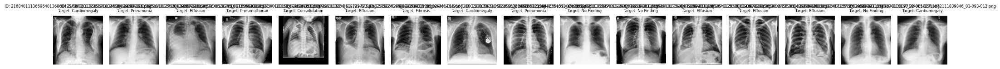

Visualizing first batch WITH preprocess input of the model


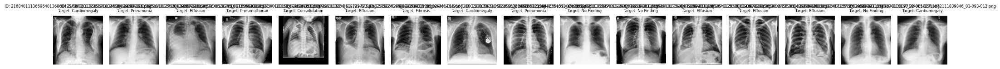

In [13]:
for idx, config in enumerate(configurations):
    globals().update(config)
    print(f'\n\n{config}')

    train_aug_pipeline = None
    train_batch_aug = None

    valid_aug_pipeline = None
    valid_batch_aug = None

    base_model_name = config['base_model']
    base_model_fn, preprocess_input = Classifiers.get(base_model_name)

    ### without preprocess input
    print('\nVisualizing first batch WITHOUT preprocess input of the model')
    no_preprocess_gen = DataGenerator(df_train,
                            batch_size=train_batch_setting, shuffle=False,
                            augmentation_pipeline=train_aug_pipeline,
                            batch_augmentation=train_batch_aug,
                            preprocess=None)
    for i, (x,y) in enumerate(no_preprocess_gen):
        plt.figure(figsize=(20,3))
        for j in range(1):
            for k in range(16):
                plt.subplot(1, 16, j*16+k+1)
                img_id = df_train.iloc[i*16+j*16+k]['Image Index']
                plt.title(f'ID: {img_id}\nTarget: {df_train.iloc[i*16+j*16+k]["Finding Labels"]}', size=6)
                img = x[j*16+k,:,:,:3]
                img = img.astype('uint8')
                plt.imshow(img)
                plt.axis('off')
        plt.tight_layout()
        plt.show()
        if i==0: break

    ### with preprocess input
    with_preprocess_gen = DataGenerator(df_train,
                            batch_size=train_batch_setting, shuffle=False,
                            augmentation_pipeline=train_aug_pipeline,
                            batch_augmentation=train_batch_aug,
                            preprocess=preprocess_input)
    print('Visualizing first batch WITH preprocess input of the model')
    for i, (x,y) in enumerate(with_preprocess_gen):
        plt.figure(figsize=(20,3))
        for j in range(1):
            for k in range(16):
                plt.subplot(1, 16, j*16+k+1)
                img_id = df_train.iloc[i*16+j*16+k]['Image Index']
                plt.title(f'ID: {img_id}\nTarget: {df_train.iloc[i*16+j*16+k]["Finding Labels"]}', size=6)
                img = x[j*16+k,:,:,:3]
                img = img.astype('uint8')
                plt.imshow(img)
                plt.axis('off')
        plt.tight_layout()
        plt.show()
        if i==0: break

In [14]:
import tensorflow as tf
import tensorflow.keras.backend as K
from collections import defaultdict
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import gc
import albumentations as A
from tensorflow.keras.callbacks import ReduceLROnPlateau

def run_experiment(idx,config, df_train, df_test, TARGET):
    
    # 1. Updating Config Properties
    globals().update(config)
    print(config)
    
        # Train Augmentation Pipeline (이미지 단위, 배치단위)
    train_aug_pipeline = AugmentationPipeline(albumentation_augs=train_augs)
    train_batch_aug = BatchAugmentation(train_batch_augmentation_params)

        # Validation Data Augmentation Pipeline (이미지 단위, 배치단위)
    valid_aug_pipeline = AugmentationPipeline(albumentation_augs=valid_augs)
    valid_batch_aug = BatchAugmentation(valid_batch_augmentation_params)

    EPOCHS = epoch_setting
    lr = ReduceLROnPlateau(monitor = 'val_auc',
                           factor = 0.1, patience = 1, min_delta = 0.01,
                           mode='max',verbose=1)
    all_oof,all_true,all_index = [],[],[]
    all_history = defaultdict(list)

    base_model_name = config['base_model']
    base_model_fn, preprocess_input = Classifiers.get(base_model_name)


    #2. Visualizing one batch for the configs' properties.
    visualizing_gen = DataGenerator(df_train,
                            batch_size=train_batch_setting, shuffle=False,
                            augmentation_pipeline=train_aug_pipeline,
                            batch_augmentation=train_batch_aug,
                            preprocess=preprocess_input)
    for i, (x,y) in enumerate(visualizing_gen):
        plt.figure(figsize=(20,3))
        for j in range(1):
            for k in range(16):
                plt.subplot(1, 16, j*16+k+1)
                img_id = df_train.iloc[i*16+j*16+k]['Image Index']
                plt.title(f'ID: {img_id}\nTarget: {df_train.iloc[i*16+j*16+k]["Finding Labels"]}', size=6)
                img = x[j*16+k,:,:,:3]
                img = img.astype('uint8')
                plt.imshow(img)
                plt.axis('off')
        plt.tight_layout()
        plt.show()
        if i==0: break

    #3. Training and validation
    for i in range(fold_num_setting):
        print('#'*25)
        print(f'### Fold {i+1}')

        train_data = df_train[df_train['Fold'] != i]
        train_gen = DataGenerator(train_data,
                                  batch_size=train_batch_setting, shuffle=True,
                                  augmentation_pipeline=train_aug_pipeline,
                                  batch_augmentation=train_batch_aug,
                                  preprocess=preprocess_input)

        valid_data = df_train[df_train['Fold'] == i]
        valid_gen = DataGenerator(valid_data,
                                  batch_size=valid_batch_setting, shuffle=False,
                                  augmentation_pipeline=valid_aug_pipeline,
                                  batch_augmentation=valid_batch_aug,
                                  preprocess=preprocess_input)

        print(f'### train size {len(train_data)}, valid size {len(valid_data)}')
        print('#'*25)

        K.clear_session()
        with strategy.scope():
            model = build_model(base_model_fn)
        if i == 0:
            print('######## Model Summary #######')
            print(model.optimizer.get_config())
            model.summary()

        if LOAD_MODELS_FROM is None:
            history = model.fit(train_gen, verbose=2,
                                validation_data=valid_gen,
                                epochs=epoch_setting, callbacks=[lr])
            model.save_weights(f'ResNet_{idx}_f{i}.weights.h5')

            for metric in ['loss', 'val_loss', 'auc','val_auc','learning_rate']:
                all_history[metric].append(history.history[metric])
        else:
            model.load_weights(f'{LOAD_MODELS_FROM}ResNet_{idx}_f{i}.weights.h5')

        oof = model.predict(valid_gen, verbose=2)
        all_oof.append(oof)
        all_true.append(valid_data[TARGET].values)
        all_index.append(valid_data['path'].values)

        del model, oof, train_gen, valid_gen
        gc.collect()

    all_oof = np.concatenate(all_oof)
    all_true = np.concatenate(all_true)
    all_index = np.concatenate(all_index)

    #4. Test predictions
    preds = []
    model = build_model(base_model_fn)
    test_gen = DataGenerator(df_test,
                             batch_size=test_batch_setting, shuffle=False,
                             augmentation_pipeline=valid_aug_pipeline,
                             batch_augmentation=valid_batch_aug,
                             preprocess=preprocess_input)

    for i in range(fold_num_setting):
        print(f'Fold {i+1}')
        if LOAD_MODELS_FROM:
            model.load_weights(f'{LOAD_MODELS_FROM}ResNet_{str(learning_rate_setting)}_f{i}.weights.h5')
        else:
            model.load_weights(f'ResNet_{idx}_f{i}.weights.h5')
        pred = model.predict(test_gen, verbose=2)
        preds.append(pred)

    pred_res = np.mean(preds, axis=0)

    return {
        'config': config,
        'train_data': {
            'all_oof': all_oof,
            'all_true': all_true,
            'all_index': all_index
        },
        'test_data': {
            'pred_res': pred_res,
            'true_values': df_test[TARGET].values
        },
        'history': all_history
    }

def analyze_results(result, TARGET):
    # Plot training history
    if LOAD_MODELS_FROM is None:
        plot_training_history(result['history'])

    print('###########TRAIN RESULT')

    # Train results analysis
    result_train, train_cm = comprehensive_model_evaluation(
        result['train_data']['all_true'], result['train_data']['all_oof'], TARGET)

    
    # Test results analysis
    print('\n###########Test RESULT')
    result_test, test_cm = comprehensive_model_evaluation(
        result['test_data']['true_values'], result['test_data']['pred_res'], TARGET)
    print('\n\n\n')


    # AP/PA view에 따른 라벨별 AUC 비교
    print('###########AUC Comparison by View Position')
    
    train_paths = result['train_data']['all_index']
    train_view_positions = df[df['path'].isin(train_paths)]['view'].values
    test_view_positions = df_test['view'].values
    
    # Train data AUC 비교
    print('\nTrain Data AUC Comparison:')
    train_auc_df = auc_comparison_by_view(
        train_view_positions,
        result['train_data']['all_true'],
        result['train_data']['all_oof'],
        TARGET
    )
    
    # Test data AUC 비교
    print('\nTest Data AUC Comparison:')
    test_auc_df = auc_comparison_by_view(
        test_view_positions,
        result['test_data']['true_values'],
        result['test_data']['pred_res'],
        TARGET
    )
    
        
    return {
        'train_results': {
            'metrics_per_class': result_train.to_dict(orient='records'),
            'micro_avg_precision': result_train['AP'].mean(),
            'macro_avg_precision': result_train['AP'].mean(),
            'avg_precision': result_train['Precision'].mean(),
            'avg_recall': result_train['Recall'].mean(),
            'avg_f1_score': result_train['F1-score'].mean(),
            'avg_auc': result_train['AUC'].mean(),
            'confusion_matrices': train_cm
        },
        'test_results': {
            'metrics_per_class': result_test.to_dict(orient='records'),
            'micro_avg_precision': result_test['AP'].mean(),
            'macro_avg_precision': result_test['AP'].mean(),
            'avg_precision': result_test['Precision'].mean(),
            'avg_recall': result_test['Recall'].mean(),
            'avg_f1_score': result_test['F1-score'].mean(),
            'avg_auc': result_test['AUC'].mean(),
            'confusion_matrices': test_cm
        }
    }


# <div style="padding: 25px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#A51C30"><b><span style='color:#A51C30'></span></b> <b>6. TRAIN & TEST</b></div>

#########################################
실험번호: 1
{'sample_number_setting': 500, 'epoch_setting': 10, 'label_smooth_setting': 0.15, 'learning_rate_setting': 0.0003, 'train_batch_setting': 16, 'valid_batch_setting': 32, 'test_batch_setting': 64, 'fold_num_setting': 5, 'clahe_setting': [2.0, (4, 4)], 'train_augs': [Resize(p=1.0, height=256, width=256, interpolation=1)], 'train_batch_augmentation_params': {}, 'valid_augs': [Resize(p=1.0, height=256, width=256, interpolation=1)], 'valid_batch_augmentation_params': {}, 'base_model': 'resnet18', 'optimizer_setting': 'optimizers.Adam(learning_rate=learning_rate_setting)'}


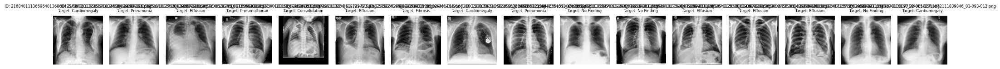

#########################
### Fold 1
### train size 2720, valid size 680
#########################
44920640/44920640 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
######## Model Summary #######
{'name': 'adam', 'learning_rate': 0.0003000000142492354, 'weight_decay': None, 'clipnorm': None, 'global_clipnorm': None, 'clipvalue': None, 'use_ema': False, 'ema_momentum': 0.99, 'ema_overwrite_frequency': None, 'loss_scale_factor': None, 'gradient_accumulation_steps': None, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-07, 'amsgrad': False}


Model: "hybrid"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_1 (Functional)       │ (None, 8, 8, 512)      │    11,186,889 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,192,019 (42.69 MB)

 Trainable params: 11,174,538 (42.63 MB)

 Non-trainable params: 17,481 (68.29 KB)

Epoch 1/10
170/170 - 87s - 513ms/step - auc: 0.7245 - loss: 0.4438 - val_auc: 0.7220 - val_loss: 0.4535 - learning_rate: 3.0000e-04
Epoch 2/10
170/170 - 27s - 158ms/step - auc: 0.8424 - loss: 0.3976 - val_auc: 0.8091 - val_loss: 0.4150 - learning_rate: 3.0000e-04
Epoch 3/10

Epoch 3: ReduceLROnPlateau reducing learning rate to 3.000000142492354e-05.
170/170 - 26s - 154ms/step - auc: 0.8816 - loss: 0.3832 - val_auc: 0.7700 - val_loss: 0.4381 - learning_rate: 3.0000e-04
Epoch 4/10
170/170 - 27s - 156ms/step - auc: 0.9291 - loss: 0.3590 - val_auc: 0.8600 - val_loss: 0.3871 - learning_rate: 3.0000e-05
Epoch 5/10

Epoch 5: ReduceLROnPlateau reducing learning rate to 3.000000106112566e-06.
170/170 - 28s - 162ms/step - auc: 0.9595 - loss: 0.3422 - val_auc: 0.8680 - val_loss: 0.3853 - learning_rate: 3.0000e-05
Epoch 6/10
170/170 - 27s - 157ms/step - auc: 0.9692 - loss: 0.3347 - val_auc: 0.8716 - val_loss: 0.3850 - learning_rate: 3.0000e-06
Epoch 7/10

Epoch 7: ReduceLROnPlateau reducing learni

I0000 00:00:1727865499.229070      69 service.cc:145] XLA service 0x7a4267c59d10 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1727865499.229120      69 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1727865499.229124      69 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1727865500.857694      69 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


14/14 - 16s - 1s/step
Fold 2
14/14 - 6s - 451ms/step
Fold 3
14/14 - 6s - 439ms/step
Fold 4
14/14 - 6s - 423ms/step
Fold 5
14/14 - 6s - 446ms/step
실험번호 1 완료




In [15]:
raw_results = []
for idx, config in enumerate(configurations):
    print('#########################################')
    print(f'실험번호: {idx+1}')
    result = run_experiment(idx,config,df_train,df_test,TARGET)
    raw_results.append(result)
    print(f'실험번호 {idx+1} 완료\n\n')


# <div style="padding: 25px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#A51C30"><b><span style='color:#A51C30'></span></b> <b>7. RESULT</b></div>

#########################################
#########################################
#########################################
Analyzing results for experiment 1


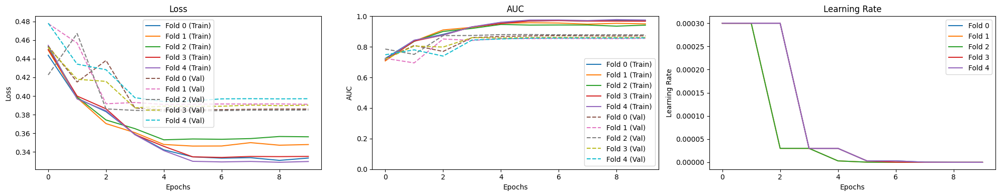

###########TRAIN RESULT


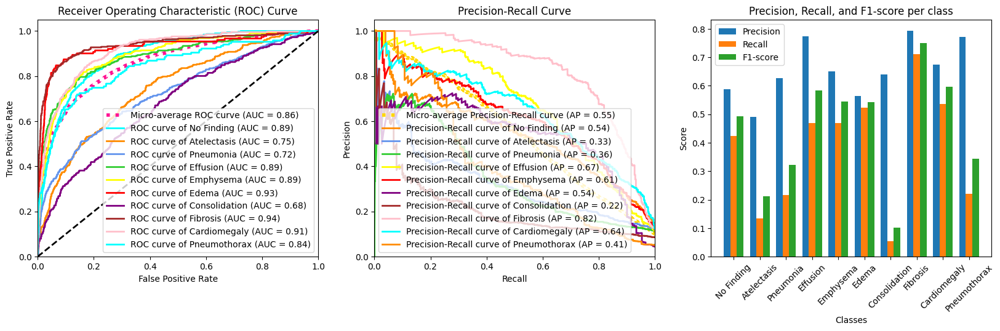

Micro-average Precision: 0.5529
Macro-average Precision: 0.5135

Metrics per class:
           Class  Precision    Recall  F1-score       AUC        AP
0     No Finding   0.588235  0.423280  0.492308  0.890595  0.540340
1    Atelectasis   0.490909  0.134663  0.211350  0.746528  0.331003
2      Pneumonia   0.626866  0.217054  0.322457  0.724746  0.355279
3       Effusion   0.773109  0.468193  0.583201  0.886630  0.669552
4      Emphysema   0.649660  0.469287  0.544936  0.892279  0.609545
5          Edema   0.564286  0.523179  0.542955  0.928154  0.535841
6  Consolidation   0.640000  0.054983  0.101266  0.678582  0.217793
7       Fibrosis   0.792453  0.710145  0.749045  0.939332  0.819847
8   Cardiomegaly   0.674847  0.535280  0.597015  0.912683  0.642030
9   Pneumothorax   0.770833  0.221557  0.344186  0.841660  0.413725

###########Test RESULT


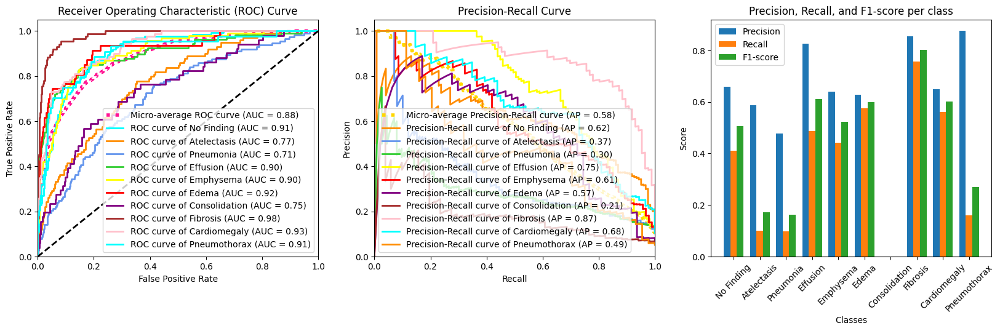

Micro-average Precision: 0.5810
Macro-average Precision: 0.5454

Metrics per class:
           Class  Precision    Recall  F1-score       AUC        AP
0     No Finding   0.657895  0.409836  0.505051  0.905732  0.617045
1    Atelectasis   0.588235  0.101010  0.172414  0.768375  0.369636
2      Pneumonia   0.478261  0.097345  0.161765  0.713481  0.295768
3       Effusion   0.825397  0.485981  0.611765  0.900173  0.745293
4      Emphysema   0.640625  0.440860  0.522293  0.900559  0.609998
5          Edema   0.627907  0.574468  0.600000  0.919313  0.572465
6  Consolidation   0.000000  0.000000  0.000000  0.746593  0.205105
7       Fibrosis   0.855263  0.755814  0.802469  0.980590  0.867359
8   Cardiomegaly   0.649351  0.561798  0.602410  0.926170  0.678928
9   Pneumothorax   0.875000  0.159091  0.269231  0.905993  0.492534




###########AUC Comparison by View Position

Train Data AUC Comparison:


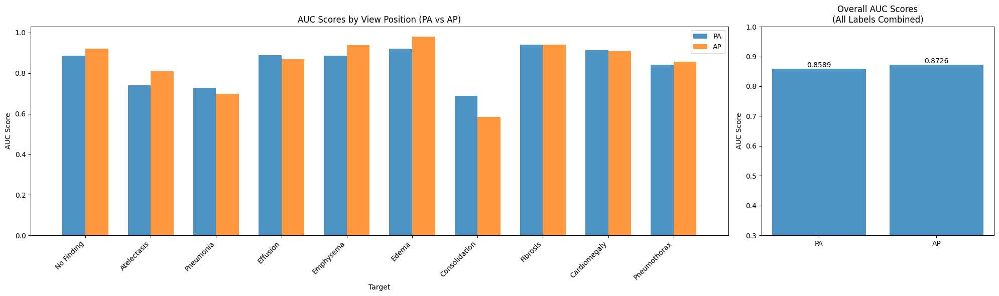


AUC Statistics:
+---------------+----------+----------+------------------------+
| Target        | PA AUC   | AP AUC   | Difference (PA - AP)   |
+===============+==========+==========+========================+
| No Finding    | 0.8862   | 0.9217   | -0.0355                |
+---------------+----------+----------+------------------------+
| Atelectasis   | 0.7388   | 0.8080   | -0.0691                |
+---------------+----------+----------+------------------------+
| Pneumonia     | 0.7276   | 0.6973   | 0.0303                 |
+---------------+----------+----------+------------------------+
| Effusion      | 0.8891   | 0.8687   | 0.0203                 |
+---------------+----------+----------+------------------------+
| Emphysema     | 0.8868   | 0.9389   | -0.0522                |
+---------------+----------+----------+------------------------+
| Edema         | 0.9214   | 0.9800   | -0.0586                |
+---------------+----------+----------+------------------------+
| Consol

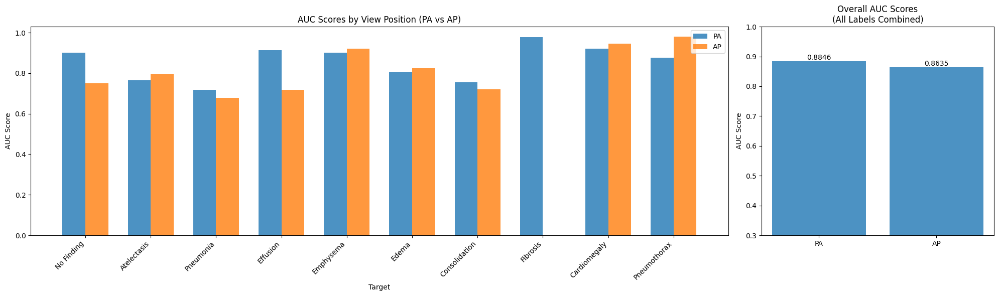


AUC Statistics:
+---------------+----------+----------+------------------------+
| Target        | PA AUC   | AP AUC   | Difference (PA - AP)   |
+===============+==========+==========+========================+
| No Finding    | 0.9011   | 0.7500   | 0.1511                 |
+---------------+----------+----------+------------------------+
| Atelectasis   | 0.7649   | 0.7947   | -0.0298                |
+---------------+----------+----------+------------------------+
| Pneumonia     | 0.7190   | 0.6778   | 0.0411                 |
+---------------+----------+----------+------------------------+
| Effusion      | 0.9132   | 0.7188   | 0.1944                 |
+---------------+----------+----------+------------------------+
| Emphysema     | 0.9008   | 0.9200   | -0.0192                |
+---------------+----------+----------+------------------------+
| Edema         | 0.8055   | 0.8249   | -0.0194                |
+---------------+----------+----------+------------------------+
| Consol

In [16]:
analyzed_results = []
for idx, result in enumerate(raw_results):
    print('#########################################')
    print('#########################################')
    print('#########################################')
    print(f"Analyzing results for experiment {idx+1}")
    analysis = analyze_results(result, TARGET)
    analyzed_results.append(analysis)
    print(f"Analysis for experiment {idx+1} completed\n\n\n")

# <div style="padding: 25px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#A51C30"><b><span style='color:#A51C30'></span></b> <b>8. GradCAM</b></div>

In [17]:
def build_grad_model(base_model_fn):
    inp = tf.keras.layers.Input(shape=(256,256,3))
    if 'densenet' in base_model_fn.__name__.lower():
        base_model = tf.keras.applications.DenseNet121(
            include_top=False, 
            weights='imagenet', 
            input_shape=(256, 256, 3)
        )
    else:base_model = base_model_fn(include_top=False, weights='imagenet', input_shape=(256,256,3))
    base_model._name = base_model_fn.__name__
    last_conv_layer = base_model(inp)
    x = tf.keras.layers.GlobalAveragePooling2D()(last_conv_layer)
    output = tf.keras.layers.Dense(len(TARGET), activation='sigmoid', dtype='float32')(x)
    grad_model = tf.keras.Model(inputs=inp, outputs= [last_conv_layer, output])
    return grad_model

def get_gradcam(grad_model, img_array, pred_index=None):
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        pred_index = tf.cast(pred_index, dtype=tf.int32)
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = tf.einsum('ijk,k->ij', last_conv_layer_output, pooled_grads)  # Use einsum to ensure proper broadcasting
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    heatmap = tf.image.resize(heatmap[..., tf.newaxis], (img_array.shape[1], img_array.shape[2]))  # Resize to (256, 256)
    heatmap = tf.squeeze(heatmap)  # Remove the singleton dimensions

    return heatmap.numpy()

#########################################
실험번호: 1
Fold Number: 0
1/1 - 2s - 2s/step


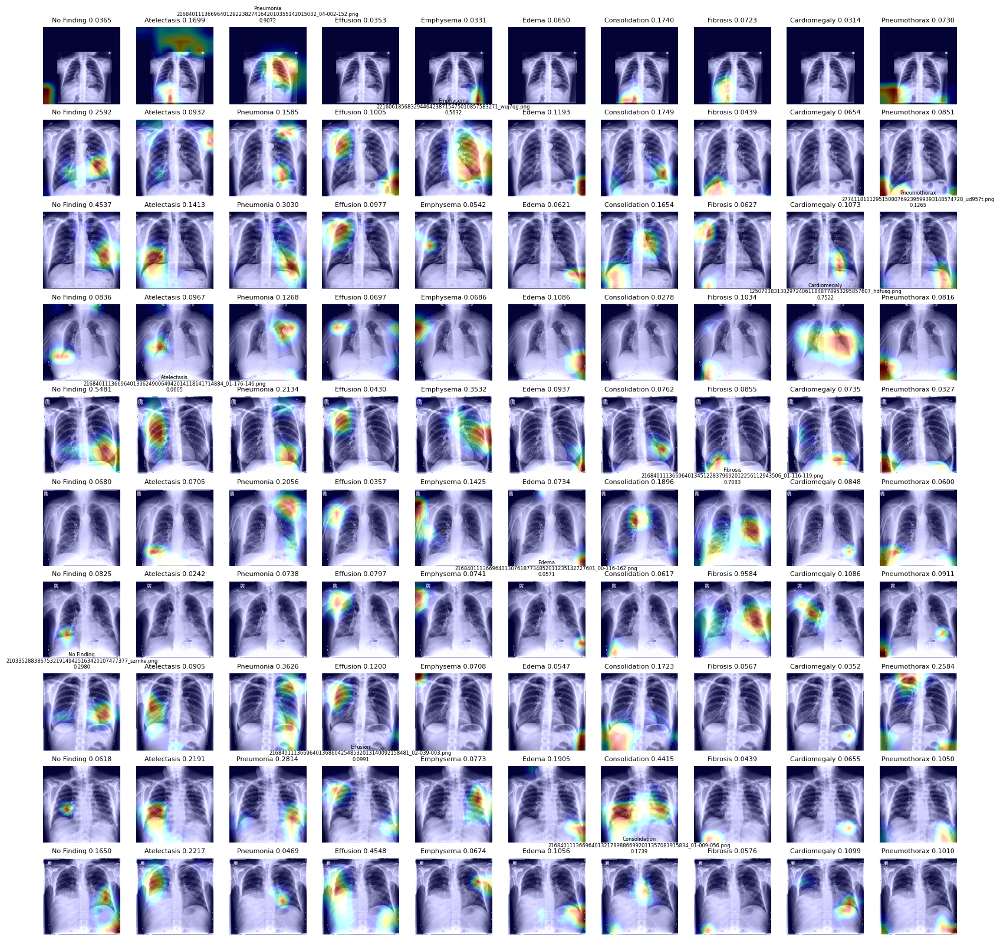

Fold Number: 1
1/1 - 1s - 1s/step


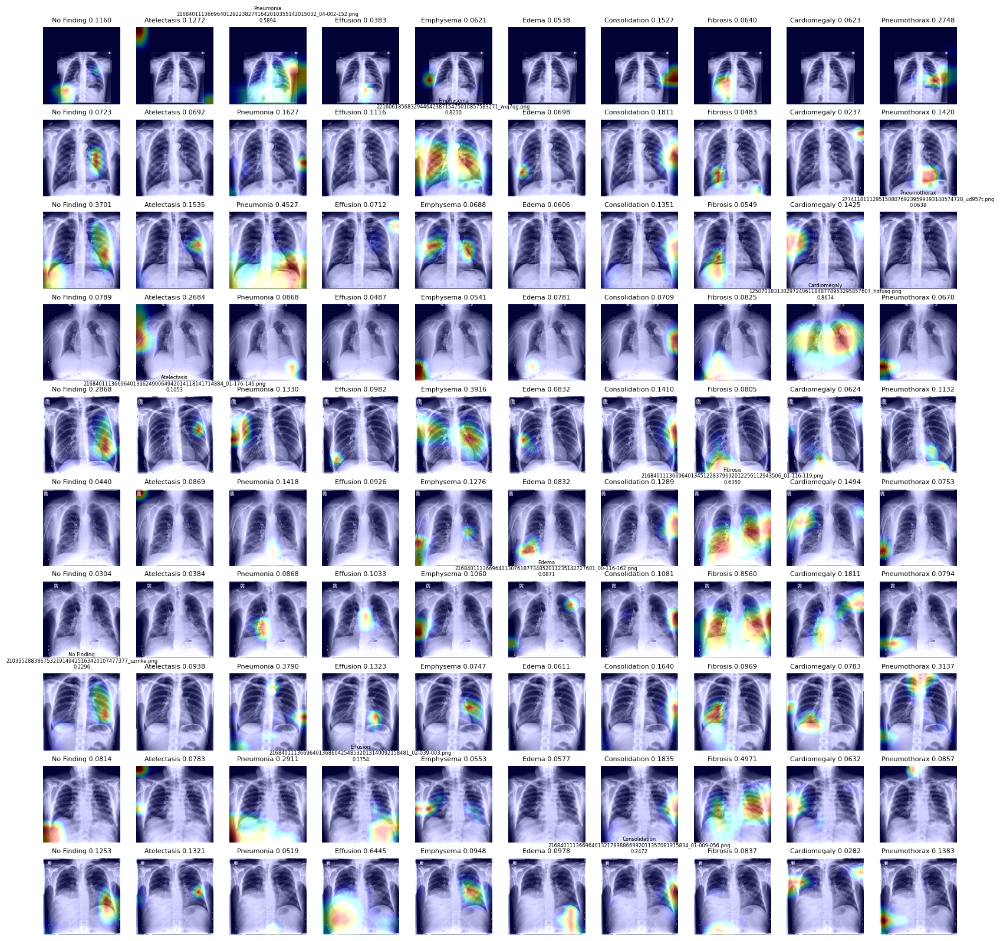

Fold Number: 2
1/1 - 1s - 1s/step


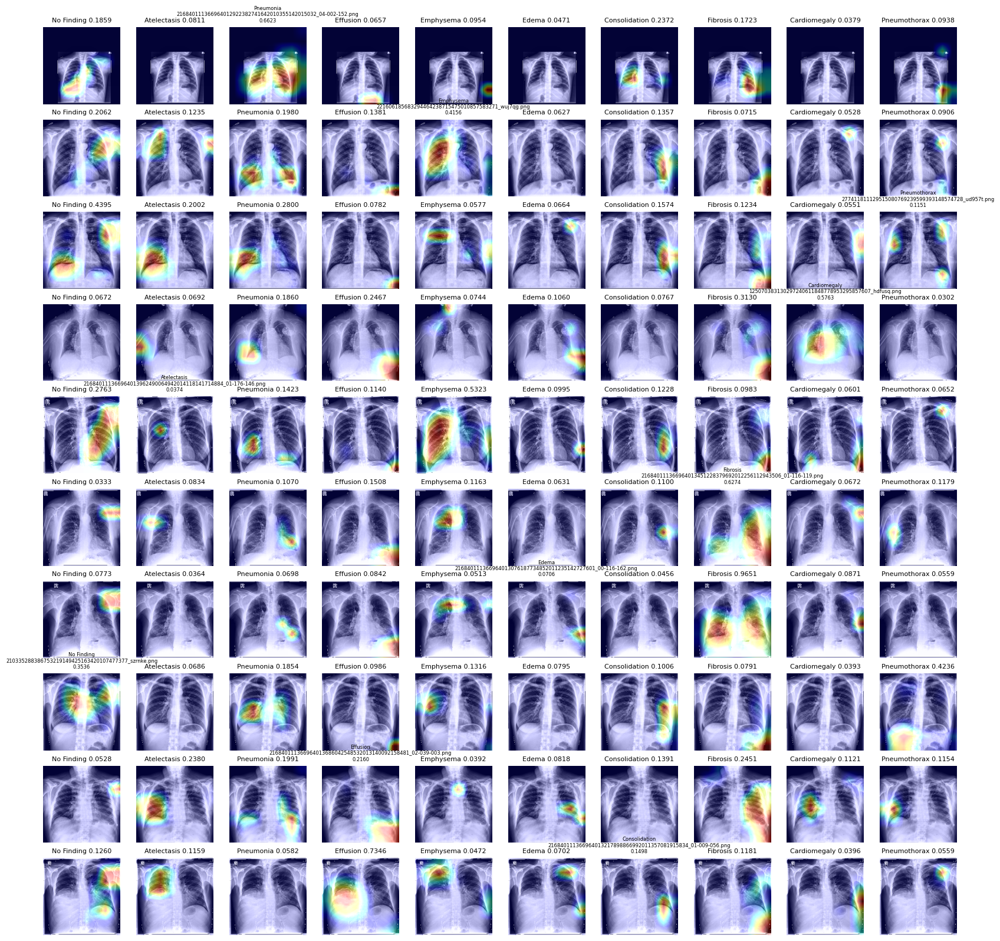

Fold Number: 3
1/1 - 1s - 1s/step


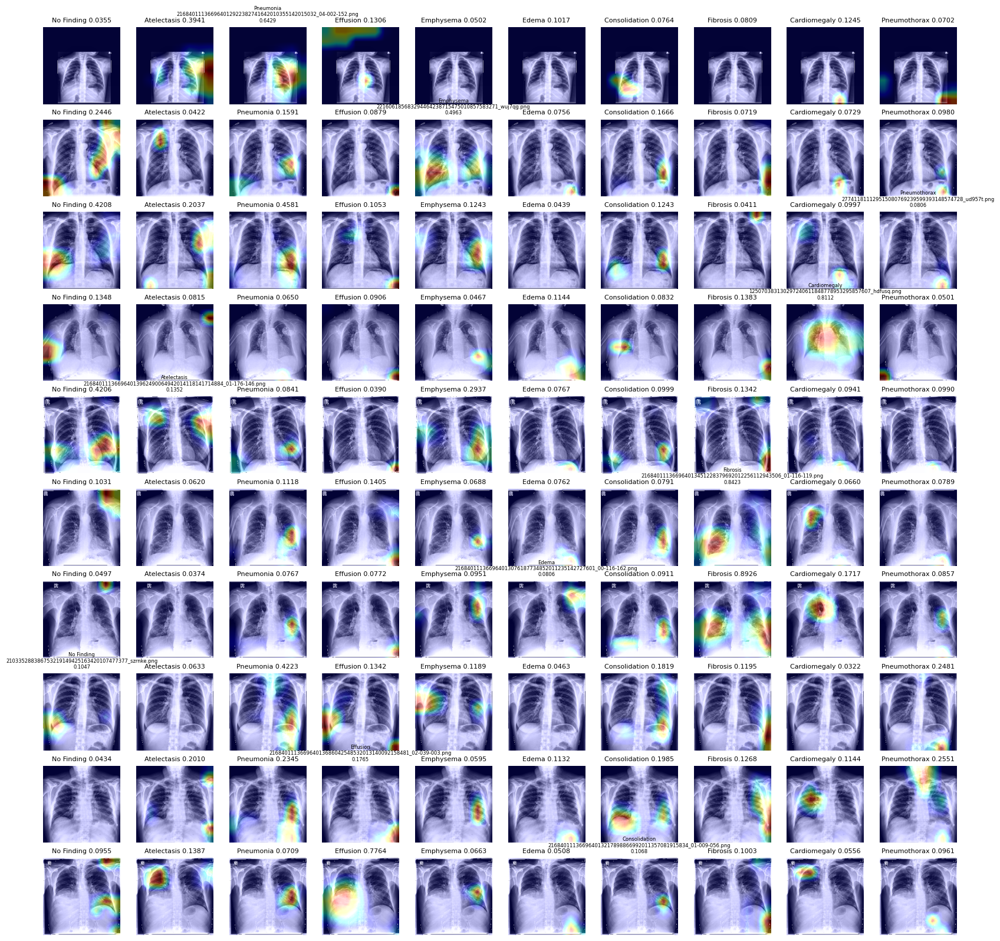

Fold Number: 4
1/1 - 1s - 1s/step


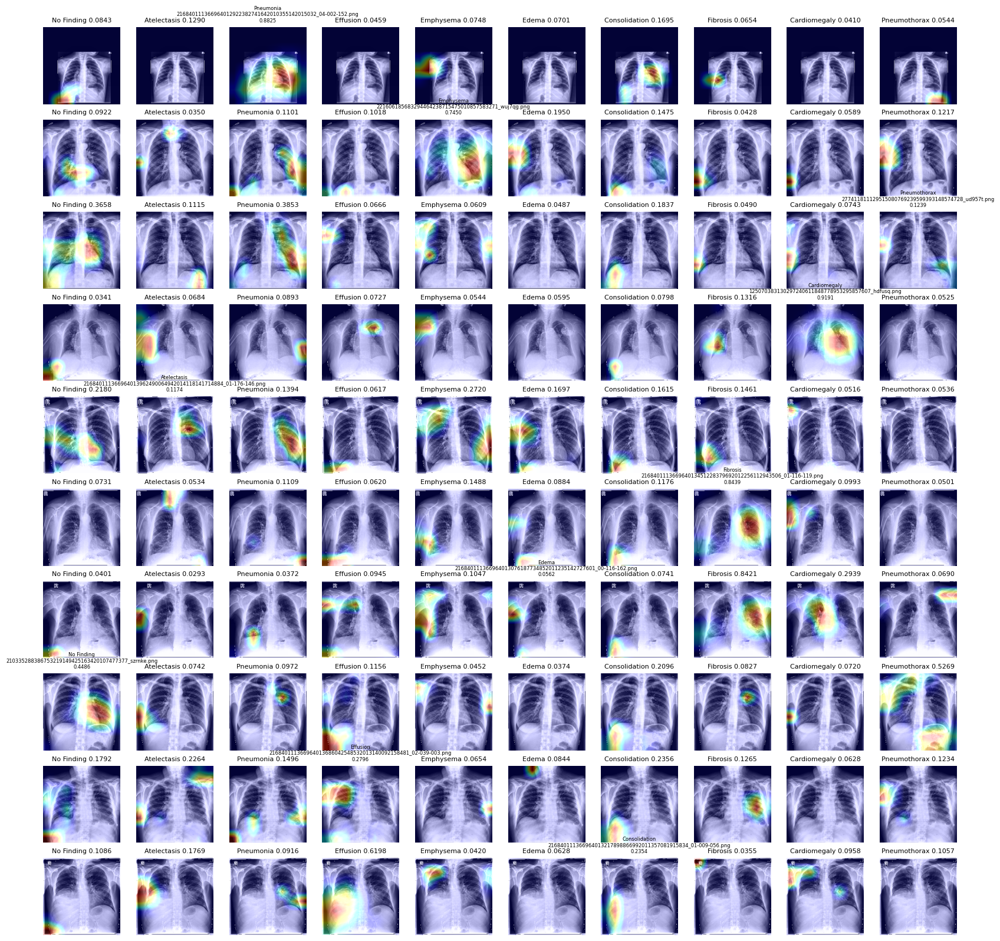

실험번호 1 완료




In [18]:
unique_labels = df_test['Finding Labels'].unique()
selected_labels = unique_labels[:min(len(TARGET), len(unique_labels))]
sampled_test = pd.concat([df_test[df_test['Finding Labels'] == label].sample(1) for label in selected_labels])

for idx, config in enumerate(configurations):
    globals().update(config)
    train_aug_pipeline = AugmentationPipeline(albumentation_augs=train_augs)
    train_batch_aug = BatchAugmentation(train_batch_augmentation_params)
    valid_aug_pipeline = AugmentationPipeline(albumentation_augs=valid_augs)
    valid_batch_aug = BatchAugmentation(valid_batch_augmentation_params)
    print('#########################################')
    print(f'실험번호: {idx+1}')
    for fi in range(config['fold_num_setting']):
        print(f'Fold Number: {fi}')
        tmp, preprocess_input = Classifiers.get(config['base_model'])

    
        test_gen = DataGenerator(sampled_test,
                                 batch_size=len(sampled_test), shuffle=False,
                                 augmentation_pipeline=valid_aug_pipeline,
                                 batch_augmentation=valid_batch_aug,
                                 preprocess=preprocess_input)

        model = build_model(tmp)
        model.load_weights(f'ResNet_{idx}_f{fi}.weights.h5')
        pred = model.predict(test_gen, verbose=2)
        
        grad_model = build_grad_model(tmp)
        grad_model.load_weights(f'ResNet_{idx}_f{fi}.weights.h5') 
        
        plt.figure(figsize=(20,20))
        for i in range(len(sampled_test)):
            x,y = test_gen[0][0][i], test_gen[0][1][i]
            img_o = x[:,:,:3]
            for ti in range(len(TARGET)):
                plt.subplot(len(sampled_test), len(TARGET), i*len(TARGET)+ti+1)
                img_tmp = img_o.copy()
                heatmap = get_gradcam(grad_model, np.expand_dims(img_tmp, axis=0), ti)
                heatmap = np.uint8(255 * heatmap)
                heatmap = plt.cm.jet(heatmap)[:,:, :3]
                heatmap = np.clip(heatmap, 0, 1)
                img_tmp = img_tmp / 255.0
                superimposed_img = heatmap * 0.4 + img_tmp
                superimposed_img = np.clip(superimposed_img, 0, 1)
                plt.imshow(superimposed_img)
                if ti != int(np.argmax(y)):plt.title(f'{TARGET[ti]} {pred[i][ti]:.4f}', fontsize=8)
                else:plt.title(f"{TARGET[ti]}\n{sampled_test.iloc[i]['Image Index']}\n{pred[i][ti]:.4f}",fontsize=6)
                plt.axis('off')  # 축 눈금 제거
        plt.show()
        del model, grad_model
                    
    print(f'실험번호 {idx+1} 완료\n\n')

# <div style="padding: 25px;color:white;margin:10;font-size:60%;text-align:left;display:fill;border-radius:10px;background-color:#FFFFFF;overflow:hidden;background-color:#A51C30"><b><span style='color:#A51C30'></span></b> <b>9. Overall Result</b></div>

In [19]:
# Print summary of results
print("\nSummary of All Experiments:")
print(f"{'='*150}")
print(f"{'Experiment':^10} | {'Train Acc':^10} | {'Train F1':^10} | {'Test Acc':^10} | {'Test F1':^10} | {'Micro AP':^10} | {'Macro AP':^10} | {'Avg Prec':^10} | {'Avg Recall':^10} | {'Avg F1':^10} | {'Avg AUC':^10}")
print(f"{'-'*150}")
for idx, result in enumerate(analyzed_results):
    train_accuracy = result['train_results']['avg_precision']
    train_f1 = result['train_results']['avg_f1_score']
    test_accuracy = result['test_results']['avg_precision']
    test_f1 = result['test_results']['avg_f1_score']
    micro_ap = result['test_results']['micro_avg_precision']
    macro_ap = result['test_results']['macro_avg_precision']
    avg_precision = result['test_results']['avg_precision']
    avg_recall = result['test_results']['avg_recall']
    avg_f1 = result['test_results']['avg_f1_score']
    avg_auc = result['test_results']['avg_auc']
    
    print(f"{idx+1:^10} | {train_accuracy:^10.4f} | {train_f1:^10.4f} | {test_accuracy:^10.4f} | {test_f1:^10.4f} | {micro_ap:^10.4f} | {macro_ap:^10.4f} | {avg_precision:^10.4f} | {avg_recall:^10.4f} | {avg_f1:^10.4f} | {avg_auc:^10.4f}")
print(f"{'='*150}")

# 가장 좋은 성능의 모델 찾기
best_model_idx = max(range(len(analyzed_results)), key=lambda i: analyzed_results[i]['test_results']['avg_f1_score'])
best_model = analyzed_results[best_model_idx]

print(f"\nBest Model (Experiment {best_model_idx + 1}):")
print(f"Train Accuracy: {best_model['train_results']['avg_precision']:.4f}")
print(f"Train F1 Score: {best_model['train_results']['avg_f1_score']:.4f}")
print(f"Test Accuracy: {best_model['test_results']['avg_precision']:.4f}")
print(f"Test F1 Score: {best_model['test_results']['avg_f1_score']:.4f}")
print(f"Micro-average Precision: {best_model['test_results']['micro_avg_precision']:.4f}")
print(f"Macro-average Precision: {best_model['test_results']['macro_avg_precision']:.4f}")
print(f"Average Precision: {best_model['test_results']['avg_precision']:.4f}")
print(f"Average Recall: {best_model['test_results']['avg_recall']:.4f}")
print(f"Average F1 Score: {best_model['test_results']['avg_f1_score']:.4f}")
print(f"Average AUC: {best_model['test_results']['avg_auc']:.4f}")

# 각 클래스별 성능 출력
print("\nPer-class Performance of Best Model:")
print(f"{'Class':^15} | {'Precision':^10} | {'Recall':^10} | {'F1 Score':^10} | {'AUC':^10}")
print(f"{'-'*65}")
for class_result in best_model['test_results']['metrics_per_class']:
    print(f"{class_result['Class']:^15} | {class_result['Precision']:^10.4f} | {class_result['Recall']:^10.4f} | {class_result['F1-score']:^10.4f} | {class_result['AUC']:^10.4f}")


Summary of All Experiments:
Experiment | Train Acc  |  Train F1  |  Test Acc  |  Test F1   |  Micro AP  |  Macro AP  |  Avg Prec  | Avg Recall |   Avg F1   |  Avg AUC  
------------------------------------------------------------------------------------------------------------------------------------------------------
    1      |   0.6571   |   0.4489   |   0.6198   |   0.4247   |   0.5454   |   0.5454   |   0.6198   |   0.3586   |   0.4247   |   0.8667  

Best Model (Experiment 1):
Train Accuracy: 0.6571
Train F1 Score: 0.4489
Test Accuracy: 0.6198
Test F1 Score: 0.4247
Micro-average Precision: 0.5454
Macro-average Precision: 0.5454
Average Precision: 0.6198
Average Recall: 0.3586
Average F1 Score: 0.4247
Average AUC: 0.8667

Per-class Performance of Best Model:
     Class      | Precision  |   Recall   |  F1 Score  |    AUC    
-----------------------------------------------------------------
  No Finding    |   0.6579   |   0.4098   |   0.5051   |   0.9057  
  Atelectasis   |   0.

In [20]:
from datetime import datetime
current_time = datetime.now()
print(current_time)

2024-10-02 10:41:21.144374


In [21]:
all_final_df = pd.json_normalize(analyzed_results, sep='_')
all_final_df.to_csv('final_df.csv', encoding='utf-8-sig')
all_final_df


,train_results_metrics_per_class,train_results_micro_avg_precision,train_results_macro_avg_precision,train_results_avg_precision,train_results_avg_recall,train_results_avg_f1_score,train_results_avg_auc,train_results_confusion_matrices,test_results_metrics_per_class,test_results_micro_avg_precision,test_results_macro_avg_precision,test_results_avg_precision,test_results_avg_recall,test_results_avg_f1_score,test_results_avg_auc,test_results_confusion_matrices
0,"[{'Class': 'No Finding', 'Precision': 0.588235...",0.513495,0.513495,0.65712,0.375762,0.448872,0.844119,"[[[2910, 112], [218, 160]], [[2943, 56], [347,...","[{'Class': 'No Finding', 'Precision': 0.657894...",0.545413,0.545413,0.619793,0.35862,0.42474,0.866698,"[[[703, 26], [72, 50]], [[745, 7], [89, 10]], ..."


In [22]:
configurations_df = pd.json_normalize(configurations)
configurations_df.to_csv('config.csv', encoding='utf-8-sig')
configurations_df

,sample_number_setting,epoch_setting,label_smooth_setting,learning_rate_setting,train_batch_setting,valid_batch_setting,test_batch_setting,fold_num_setting,clahe_setting,train_augs,valid_augs,base_model,optimizer_setting
0,500,10,0.15,0.0003,16,32,64,5,"[2.0, (4, 4)]","[Resize(p=1.0, height=256, width=256, interpol...","[Resize(p=1.0, height=256, width=256, interpol...",resnet18,optimizers.Adam(learning_rate=learning_rate_se...


In [23]:
combined_df = pd.concat([all_final_df, configurations_df], axis=1)
combined_df.to_csv('combined_results_and_configs.csv', encoding='utf-8-sig', index=False)
print(combined_df.shape)
combined_df.head()



(1, 29)


,train_results_metrics_per_class,train_results_micro_avg_precision,train_results_macro_avg_precision,train_results_avg_precision,train_results_avg_recall,train_results_avg_f1_score,train_results_avg_auc,train_results_confusion_matrices,test_results_metrics_per_class,test_results_micro_avg_precision,...,learning_rate_setting,train_batch_setting,valid_batch_setting,test_batch_setting,fold_num_setting,clahe_setting,train_augs,valid_augs,base_model,optimizer_setting
0,"[{'Class': 'No Finding', 'Precision': 0.588235...",0.513495,0.513495,0.65712,0.375762,0.448872,0.844119,"[[[2910, 112], [218, 160]], [[2943, 56], [347,...","[{'Class': 'No Finding', 'Precision': 0.657894...",0.545413,...,0.0003,16,32,64,5,"[2.0, (4, 4)]","[Resize(p=1.0, height=256, width=256, interpol...","[Resize(p=1.0, height=256, width=256, interpol...",resnet18,optimizers.Adam(learning_rate=learning_rate_se...


In [24]:
print(combined_df)

                     train_results_metrics_per_class  \
0  [{'Class': 'No Finding', 'Precision': 0.588235...   

   train_results_micro_avg_precision  train_results_macro_avg_precision  \
0                           0.513495                           0.513495   

   train_results_avg_precision  train_results_avg_recall  \
0                      0.65712                  0.375762   

   train_results_avg_f1_score  train_results_avg_auc  \
0                    0.448872               0.844119   

                    train_results_confusion_matrices  \
0  [[[2910, 112], [218, 160]], [[2943, 56], [347,...   

                      test_results_metrics_per_class  \
0  [{'Class': 'No Finding', 'Precision': 0.657894...   

   test_results_micro_avg_precision  ...  learning_rate_setting  \
0                          0.545413  ...                 0.0003   

   train_batch_setting  valid_batch_setting  test_batch_setting  \
0                   16                   32                  64   

   fol

In [25]:
! pip install notion-client -qq


In [26]:
from notion_client import Client
from notion_client.errors import APIResponseError
import time
import psutil
import platform
from datetime import datetime, timedelta
import os
import pandas as pd
import numpy as np

# Notion API 설정
NOTION_TOKEN = "secret_5hvHgKyojVueRHVixJZasLS4vkTphmeveCycXpyHgzq"
NOTION_DATABASE_ID = "10b3188e288280bead72eb7d6866707d"
    
# Notion 클라이언트 초기화
notion = Client(auth=NOTION_TOKEN)

def get_system_info():
    boot_time = psutil.boot_time()
    system_start_time = datetime.fromtimestamp(boot_time)
    uptime = timedelta(seconds=int(time.time() - boot_time))
    node_id = platform.node()
    
    return {
        "system_start_time": system_start_time.isoformat(),
        "total_uptime": str(uptime),
        "node_id": node_id
    }

def simplify_column_name(name):
    return name.replace('.', '_').replace(' ', '_').lower()

def get_notion_property_type(dtype):
    if pd.api.types.is_numeric_dtype(dtype):
        return "number"
    elif pd.api.types.is_datetime64_any_dtype(dtype):
        return "date"
    elif pd.api.types.is_bool_dtype(dtype):
        return "checkbox"
    else:
        return "rich_text"

def update_database_schema(df, system_info):
    properties = {
        "title": {"title": {}},
        "timestamp": {"date": {}},
        "system_start_time": {"date": {}},
        "total_uptime": {"rich_text": {}},
        "node_id": {"rich_text": {}}
    }
    for column, dtype in df.dtypes.items():
        simplified_name = simplify_column_name(column)
        notion_type = get_notion_property_type(dtype)
        properties[simplified_name] = {notion_type: {}}
    
    notion.databases.update(
        database_id=NOTION_DATABASE_ID,
        properties=properties
    )
    print("데이터베이스 스키마가 업데이트되었습니다.")

def safe_value_conversion(value, notion_type):
    if isinstance(value, (pd.Series, np.ndarray)):
        return safe_value_conversion(value.tolist(), notion_type)
    if isinstance(value, list):
        return str(value)
    if pd.isna(value):
        return None
    if notion_type == "number":
        return float(value) if isinstance(value, (int, float)) else None
    elif notion_type == "date":
        return value.isoformat() if isinstance(value, (datetime, pd.Timestamp)) else None
    elif notion_type == "checkbox":
        return bool(value)
    else:
        return str(value)

def add_data_to_notion(df, current_time, system_info):
    notebook_name = os.environ.get('KAGGLE_KERNEL_RUN_TYPE', 'Unknown Notebook')
    print(f'title: {notebook_name}')
    print(f'timestamp: {current_time}')
    print(f'system_start_time: {system_info["system_start_time"]}')
    print(f'total_uptime: {system_info["total_uptime"]}')
    print(f'node_id: {system_info["node_id"]}')
    
    if isinstance(current_time, datetime):
        current_time = current_time.isoformat()

    for index, row in df.iterrows():
        properties = {
            "title": {"title": [{"text": {"content": notebook_name}}]},
            "timestamp": {"date": {"start": current_time}},
            "system_start_time": {"date": {"start": system_info["system_start_time"]}},
            "total_uptime": {"rich_text": [{"text": {"content": system_info["total_uptime"]}}]},
            "node_id": {"rich_text": [{"text": {"content": system_info["node_id"]}}]}
        }
        for column, value in row.items():
            simplified_name = simplify_column_name(column)
            notion_type = get_notion_property_type(df[column].dtype)
            converted_value = safe_value_conversion(value, notion_type)
            
            if notion_type == "number" and converted_value is not None:
                properties[simplified_name] = {"number": converted_value}
            elif notion_type == "date" and converted_value is not None:
                properties[simplified_name] = {"date": {"start": converted_value}}
            elif notion_type == "checkbox":
                properties[simplified_name] = {"checkbox": converted_value}
            elif converted_value is not None:
                if len(str(converted_value)) > 2000:
                    converted_value = str(converted_value)[:1997] + "..."
                properties[simplified_name] = {"rich_text": [{"text": {"content": str(converted_value)}}]}
        
        new_page = {
            "parent": {"database_id": NOTION_DATABASE_ID},
            "properties": properties
        }
        
        max_retries = 5
        initial_wait = 5
        retries = 0
        while retries < max_retries:
            try:
                response = notion.pages.create(**new_page)
                print(f"페이지가 생성되었습니다: {response['url']}")
                break
            except APIResponseError as e:
                if e.code == "rate_limited":
                    wait_time = initial_wait * (2 ** retries)
                    print(f"요청 제한에 걸렸습니다. {wait_time}초 후 재시도합니다...")
                    time.sleep(wait_time)
                    retries += 1
                else:
                    print(f"에러 발생: {e}")
                    raise
        if retries == max_retries:
            print("최대 재시도 횟수를 초과했습니다.")
        time.sleep(5)

# 메인 실행 부분
#system_info = get_system_info()
#resolved_combined_df = combined_df.drop(['train_results_metrics_per_class', 'train_results_confusion_matrices','test_results_metrics_per_class','test_results_confusion_matrices'], axis=1)
#update_database_schema(resolved_combined_df, system_info)
#current_time = datetime.now()
#add_data_to_notion(resolved_combined_df, current_time, system_info)